# SDXL の実装

[![Open In Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/py-img-gen/python-image-generation/blob/main/notebooks/4-6_stable-diffusion-xl.ipynb)

## 準備

In [1]:
!pip install -qq py-img-gen

In [2]:
import warnings

import torch

device = torch.device(
    "cuda" if torch.cuda.is_available() else "cpu"
)
dtype = torch.float16
variant = "fp16"
seed = 42

warnings.simplefilter("ignore", FutureWarning)

## SDXL による Text-to-Image 生成
- 参考: https://huggingface.co/docs/diffusers/using-diffusers/sdxl

In [3]:
from diffusers import StableDiffusionXLPipeline

pipe_t2i = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=dtype,
    variant=variant,
    use_safetensors=True,
)
pipe_t2i = pipe_t2i.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

  0%|          | 0/50 [00:00<?, ?it/s]

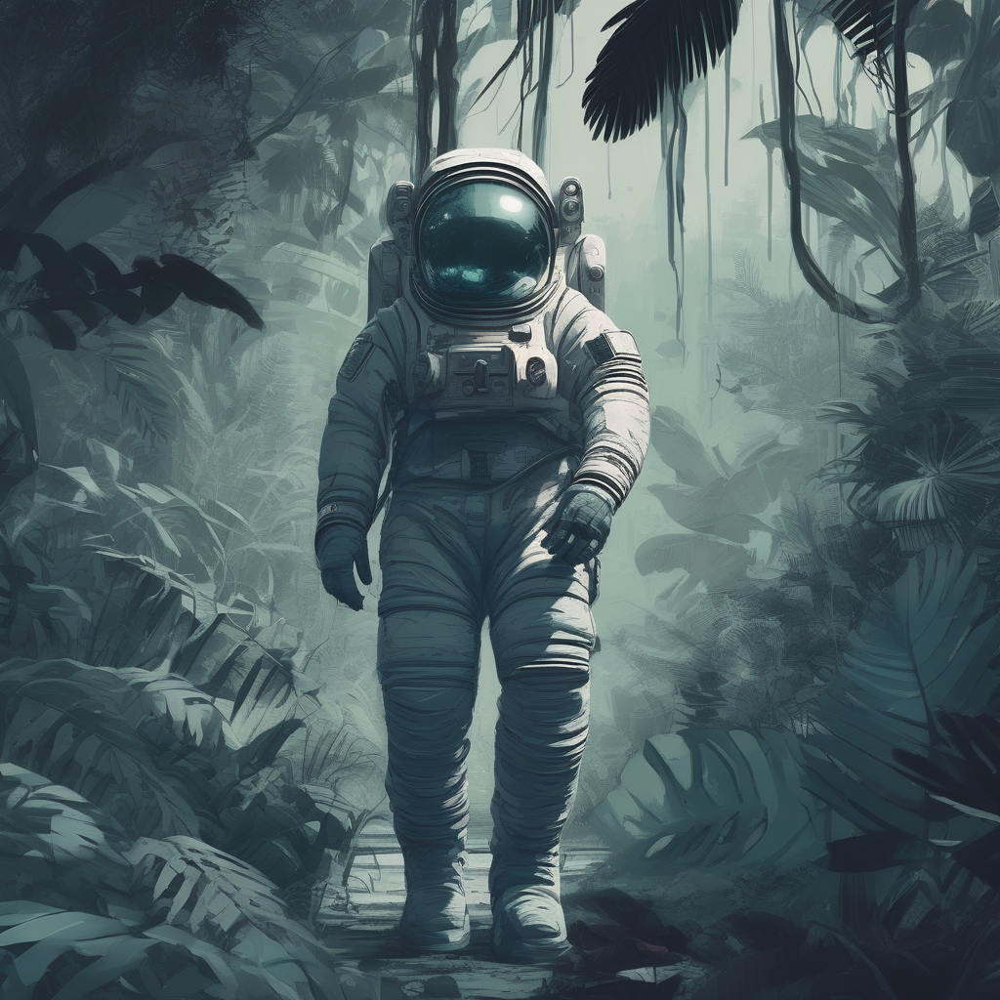

In [4]:
prompt = "Astronaut in a jungle, cold color palette, muted colors, detailed, 8k"

output = pipe_t2i(
    prompt=prompt, generator=torch.manual_seed(seed)
)
image = output.images[0]

image

## SDXL による Image-to-Image 生成

In [5]:
from diffusers import StableDiffusionXLImg2ImgPipeline
from diffusers.utils import load_image, make_image_grid

pipe_i2i = StableDiffusionXLImg2ImgPipeline.from_pipe(
    pipe_t2i
)
pipe_i2i = pipe_i2i.to(device)

  0%|          | 0/40 [00:00<?, ?it/s]

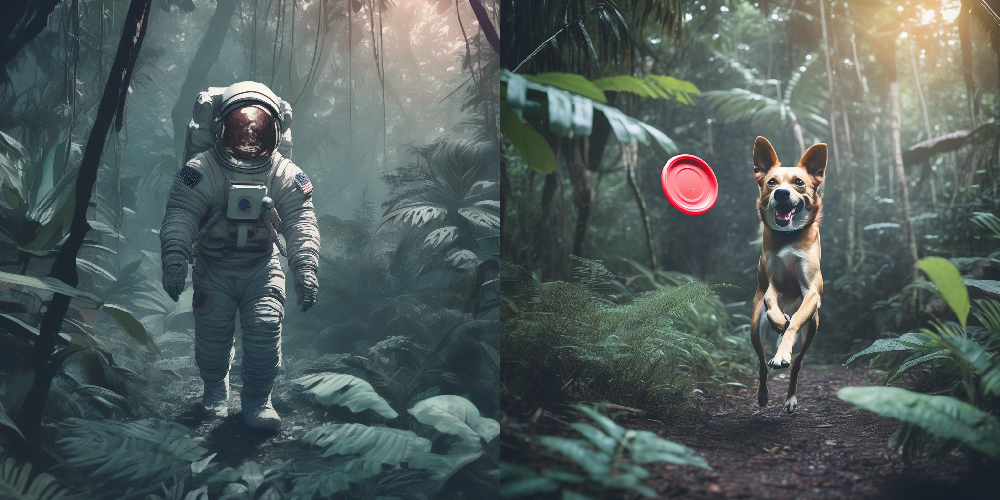

In [6]:
init_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/sdxl-text2img.png"
)
prompt = "a dog catching a frisbee in the jungle"

image = pipe_i2i(
    prompt,
    image=init_image,
    strength=0.8,
    guidance_scale=10.5,
    generator=torch.manual_seed(seed),
).images[0]

make_image_grid([init_image, image], rows=1, cols=2)

## SDXL による Inpainting

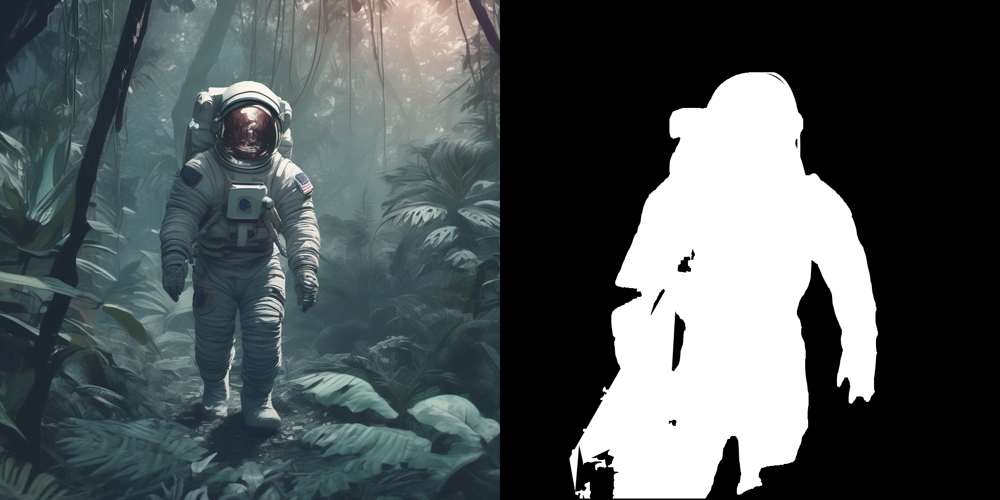

In [7]:
init_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/sdxl-text2img.png"
)
mask_image = load_image(
    "https://huggingface.co/datasets/huggingface/documentation-images/resolve/main/diffusers/sdxl-inpaint-mask.png"
)

make_image_grid([init_image, mask_image], rows=1, cols=2)

In [8]:
from diffusers import StableDiffusionXLInpaintPipeline

pipe = StableDiffusionXLInpaintPipeline.from_pipe(pipe_t2i)
pipe = pipe.to(device)

  0%|          | 0/42 [00:00<?, ?it/s]

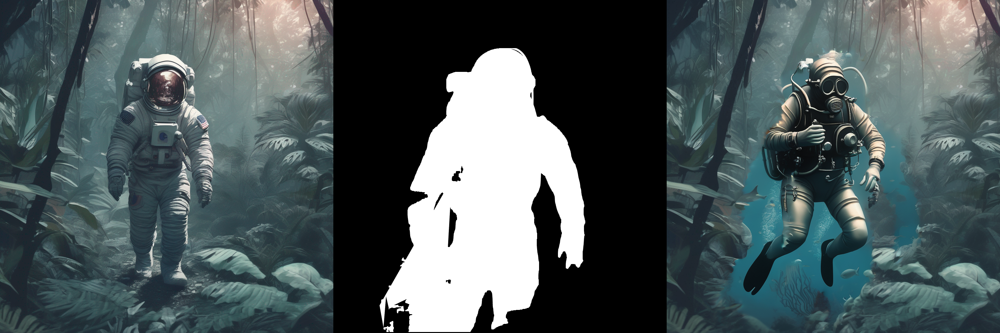

In [9]:
prompt = "A deep sea diver floating"
output = pipe(
    prompt=prompt,
    image=init_image,
    mask_image=mask_image,
    strength=0.85,
    guidance_scale=12.5,
    generator=torch.manual_seed(seed),
)
image = output.images[0]

make_image_grid(
    [init_image, mask_image, image], rows=1, cols=3
)

## SDXL の Refiner を用いた生成画像の高品質化

In [10]:
base = StableDiffusionXLPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-base-1.0",
    torch_dtype=dtype,
    variant=variant,
    use_safetensors=True,
)
base = base.to(device)

refiner = StableDiffusionXLImg2ImgPipeline.from_pretrained(
    "stabilityai/stable-diffusion-xl-refiner-1.0",
    text_encoder_2=base.text_encoder_2,
    vae=base.vae,
    torch_dtype=dtype,
    use_safetensors=True,
    variant=variant,
)
refiner = refiner.to(device)

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/5 [00:00<?, ?it/s]

In [11]:
prompt = "A majestic lion jumping from a big stone at night"

base_image = base(
    prompt=prompt,
    num_inference_steps=40,
    denoising_end=0.8,
    generator=torch.manual_seed(seed),
).images[0]

  0%|          | 0/32 [00:00<?, ?it/s]

In [12]:
base_latent_image = base(
    prompt=prompt,
    num_inference_steps=40,
    denoising_end=0.8,
    output_type="latent",
    generator=torch.manual_seed(seed),
).images[0]

  0%|          | 0/32 [00:00<?, ?it/s]

In [13]:
refined_image = refiner(
    prompt=prompt,
    num_inference_steps=40,
    denoising_start=0.8,
    image=base_latent_image,
    generator=torch.manual_seed(seed),
).images[0]

  0%|          | 0/8 [00:00<?, ?it/s]

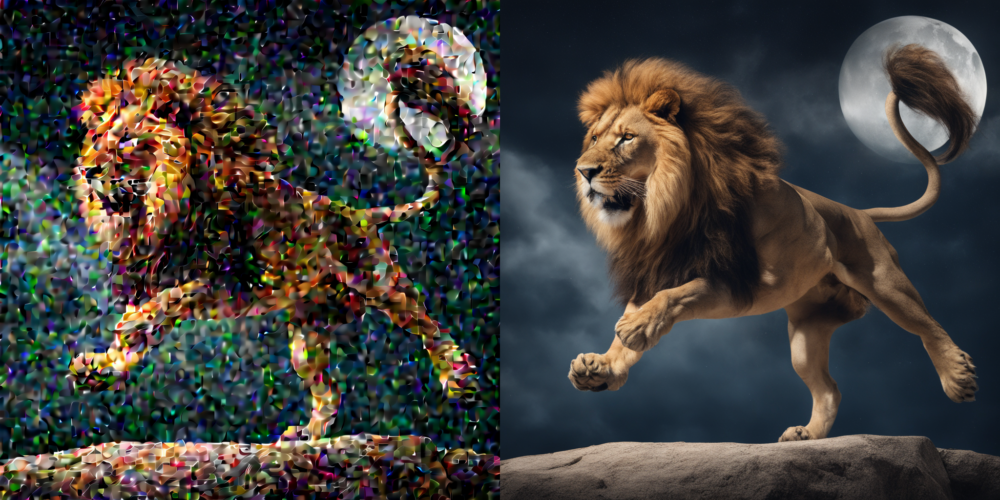

In [14]:
make_image_grid([base_image, refined_image], rows=1, cols=2)